# Исследование рынка общественного питания Москвы. Открытие кофейни

**Описание проекта**

В рамках проекта проводится исследование рынка общественного питания Москвы с целью выявления общих характеристик наиболее конкурентоспособных заведений. Результаты анализа станут опорной точкой для принятия решения об открытии кофейни, запланированное инвесторами фонда «Shut Up and Take My Money».

Основа исследования - массив данных с информацией о заведениях общественного питания Москвы, сформированный на основе выгрузок с сервисов Яндекс Карты и Яндекс Бизнес. Данные актуальны по состоянию на лето 2022 года.

**Цели проекта**: 
1. Провести анализ рынка общественного питания Москвы.
2. Детализировать исследование по рынку кофеен.
3. Сформировать рекомендации для инвесторов по открытию кофейни.
2. Подготовить презентацию с результатами исследования.

**Описание исходных данных**

- name — название заведения;
- address — адрес заведения;
- category — категория заведения, например «кафе», «пиццерия» или «кофейня»;
- hours — информация о днях и часах работы;
- lat — широта географической точки, в которой находится заведение;
- lng — долгота географической точки, в которой находится заведение;
- rating — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка - 5.0);
- price — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;
- avg_bill — строка, которая хранит среднюю стоимость заказа в виде диапазона, например:
    - «Средний счёт: 1000-1500 ₽»;
    - «Цена чашки капучино: 130-220 ₽»;
    - «Цена бокала пива: 400-600 ₽».
- middle_avg_bill — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки **«Средний счёт»**:
    - Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
    - Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
    - Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.
- middle_coffee_cup — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки **«Цена одной чашки капучино»**:
    - Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
    - Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
    - Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт.
- chain — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки):
    - 0 — заведение не является сетевым;
    - 1 — заведение является сетевым.
- district — административный район, в котором находится заведение, например Центральный административный округ;
- seats — количество посадочных мест.

**План работы**

1. Изучить входные параметры исследования: 
    * базовые: название заведения, адрес, часы работы, категория, количество посадочных мест, принадлежность к сетевой структуре;
    * стоимостные: ценовая категория, средний чек;
    * оценочные: рейтинг заведения, оценка среднего чека, средняя оценка одной чашки капучино;
    * географические: район, координаты расположения заведения (широта, долгота).
2. Произвести предобработку данных: корректировка типов данных, поиск пропусков, дубликатов, выбивающихся значений.
3. Добавить в датафрейм столбцы с названием улицы и признаком круглосуточной и ежедневной работы заведения.
4. Изучить следующие характеристики рынка общественного питания Москвы:
    * распределение заведений по категориям;
    * количество посадочных мест по категориям;
    * соотношение количества сетевых и несетевых заведений;
    * категории сетевых заведений;
    * топ-15 самых популярных сетей;
    * распределение заведений по административным округам;
    * распределение средних рейтингов заведений по категориям;
    * распределение средних рейтингов заведений по административным округам;
    * распределение заведений на карте;
    * наиболее привлекательные для открытия заведения улицы;
    * улицы, на которых расположено не более одного заведения общественного питания;
    * политика среднего чека заведений по административным округам.
5. Детализировать исследование по следующим характеристикам кофеен:
    * распределение кофеен по административным округам;
    * время работы кофеен;
    * распределение рейтингов кофеен по административным округам;
    * ценовая политика для одной чашки капучино.
6. Сформулировать рекомендации по открытию кофейни на основе изученных данных.
7. Подготовить презентацию с результатами исследования.

## Загрузка и первичный анализ данных

In [1]:
# импортируем библиотеки

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import plotly.express as px
from plotly import graph_objects as go

import json
import requests
import folium
from folium import Map, Choropleth, Marker # импортируем карту, хороплет и маркер
from folium.plugins import MarkerCluster # импортируем кластер

In [2]:
# параметры отображения данных

# снимаем ограничения по ширине столбцов
pd.set_option('display.max_colwidth', None)

# снимаем ограничения на количество столбцов
pd.set_option('display.max_columns', None)

In [3]:
# читаем данные и создаем датафрейм
try:
    data = pd.read_csv('/datasets/moscow_places.csv')
except:
    data = pd.read_csv('https://code.s3.yandex.net/datasets/moscow_places.csv')

In [4]:
# задаем функцию для получения базовой информации о датафрейме
def basic_data_info(df):
    print('\033[1m' + 'Получение базовой информации о датафрейме:' + '\033[0m')
    display(df, df.info())
    print('-' * 50)
    print('\033[1m' + '\033[1m' + 'Подсчёт количества пропусков:' + '\033[0m')
    display(pd.concat([df.isna().sum(), df.isna().mean()], axis=1)\
    .rename(columns={0:'Количество пропусков', 1:'Доля в %'})\
    .sort_values(by = 'Доля в %', ascending = False)\
    .style.background_gradient(subset=["Доля в %"], cmap="Reds")\
    .format({'Доля в %':'{:.2%}'}))
    print('-' * 50)
    print('\033[1m' + 'Количество явных дубликатов:' + '\033[0m')
    display(df.duplicated().sum())
    print('-' * 50)
    print('\033[1m' + 'Проверка корректности наименований столбцов:' + '\033[0m')
    display(df.columns)

In [5]:
# получаем базовую информацию о датафрейме
basic_data_info(data)

Получение базовой информации о датафрейме:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00–02:00",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8401,Суши Мания,кафе,"Москва, Профсоюзная улица, 56",Юго-Западный административный округ,"ежедневно, 09:00–02:00",55.670021,37.552480,4.4,NaN,NaN,NaN,NaN,0,86.0
8402,Миславнес,кафе,"Москва, Пролетарский проспект, 19, корп. 1",Южный административный округ,"ежедневно, 08:00–22:00",55.640875,37.656553,4.8,NaN,NaN,NaN,NaN,0,150.0
8403,Самовар,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648859,37.743219,3.9,NaN,Средний счёт:от 150 ₽,150.0,NaN,0,150.0
8404,Чайхана Sabr,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648849,37.743222,4.2,NaN,NaN,NaN,NaN,1,150.0


None

--------------------------------------------------
Подсчёт количества пропусков:


,Количество пропусков,Доля в %
middle_coffee_cup,7871,93.64%
middle_avg_bill,5257,62.54%
price,5091,60.56%
avg_bill,4590,54.60%
seats,3611,42.96%
hours,536,6.38%
name,0,0.00%
category,0,0.00%
address,0,0.00%
district,0,0.00%


--------------------------------------------------
Количество явных дубликатов:


0

--------------------------------------------------
Проверка корректности наименований столбцов:


Index(['name', 'category', 'address', 'district', 'hours', 'lat', 'lng',
       'rating', 'price', 'avg_bill', 'middle_avg_bill', 'middle_coffee_cup',
       'chain', 'seats'],
      dtype='object')

**Первичные итоги ознакомления с данными:**

1. Датафрейм содержит информацию о 8406 заведениях общественного питания Москвы, каждое из которых описывается 14 признаками:
    - *базовые*: название заведения, адрес, часы работы, категория, количество посадочных мест, принадлежность к сетевой структуре;
    - *стоимостные*: ценовая категория, средний чек;
    - *оценочные*: рейтинг заведения, оценка среднего чека, средняя оценка одной чашки капучино;
    - *географические*: район, координаты расположения заведения (широта, долгота). 
2. Пропуски касаются преимущественно стоимостных и оценочных характеристик заведений. Больше всего пропущенных значений фиксируется в столбцах со средней оценкой одной чашки капучино (94% пропусков), оценкой среднего чека (63%), ценовой категорией (61%) и значением среднего чека (55%). Также есть пропуски в столбцах с количеством посадочных мест (43%) и часами работы заведения (6.4%). 
2. Все наименования столбцов имеют корректный вид и пригодны для дальнейшей работы.
4. Явных дубликатов не выявлено.
5. Определены рекомендации по корректировке типов данных по следующим столбцам: 
    * 'seats' - тип данных должен быть целочисленным (int64);
    * 'chain' - тип данных должен быть булевым (bool).

## Предобработка данных

Пропущенные значения по средней оценке чашки капучино, оценке среднего чека, ценовой категории и значению среднего чека составляют более половины датафрейма. Поэтому предлагаю ввести условный маркер **-1** для сохранения объема данных и учета в дальнейшем анализе.

In [6]:
# заменянем пропуски в столбцах 'avg_bill', 'price', 'middle_avg_bill', 'middle_coffee_cup' на заглушку '-1'
for column in ['avg_bill', 'price', 'middle_avg_bill', 'middle_coffee_cup']:
    data[column] = data[column].fillna(-1)

Пропуски в столбце 'seats', скорее всего, обусловлены отсутствием посадочных мест в заведении и ориентацией на доставку, либо работу в формате take away. Поэтому в данном случае заменим пропуски на значение '0'.

In [7]:
# заменяем пропуски в столбце 'seats', меняем тип данных на целочисленный

data['seats'] = data['seats'].fillna(0).astype('int')

# Контрольная проверка
print('Пропущенных значений осталось:\n', data.isna().sum())

Пропущенных значений осталось:
 name                   0
category               0
address                0
district               0
hours                536
lat                    0
lng                    0
rating                 0
price                  0
avg_bill               0
middle_avg_bill        0
middle_coffee_cup      0
chain                  0
seats                  0
dtype: int64


Пропуски в столбце 'hours' оставим без изменений, поскольку заполнить их корректно не представляется возможным, а их общая доля в датафрейме незначительна.

In [8]:
# меняем тип данных в столбце 'chain' на булевой

data['chain'] = data['chain'].astype('bool')

Займемся проверкой на неявные дубликаты.

In [9]:
# приведем названия и адрес заведений к нижнему регистру 
for col in ['name', 'address']:
    data[col] = data[col].str.lower()

# ищем неявные дубликаты по ключевой связке название-адрес заведения
display(data[['name','address']].value_counts().head(10))

name                       address                                     
хлеб да выпечка            москва, ярцевская улица, 19                     2
more poke                  москва, волоколамское шоссе, 11, стр. 2         2
раковарня клешни и хвосты  москва, проспект мира, 118                      2
кафе                       москва, парк ангарские пруды                    2
нам                        москва, саввинская набережная, 19, стр. 1а      1
                           москва, ленинградский проспект, 69, стр. 1      1
назис пури                 москва, люблинская улица, 61                    1
название забыл             москва, ленинский проспект, 86                  1
навруз                     москва, новоясеневский проспект, 1б, корп. 2    1
на смирновской             москва, смирновская улица, 25, стр. 4           1
dtype: int64

In [10]:
# проверим строки с выявленными дубликатами
display(data[data.duplicated(subset = ['name', 'address'], keep = False)])

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
189,кафе,кафе,"москва, парк ангарские пруды",Северный административный округ,"ежедневно, 09:00–23:00",55.880327,37.530786,3.2,-1,-1,-1.0,-1.0,False,0
215,кафе,кафе,"москва, парк ангарские пруды",Северный административный округ,"ежедневно, 10:00–22:00",55.881438,37.531848,3.2,-1,-1,-1.0,-1.0,False,0
1430,more poke,ресторан,"москва, волоколамское шоссе, 11, стр. 2",Северный административный округ,"ежедневно, 09:00–21:00",55.806307,37.497566,4.2,-1,-1,-1.0,-1.0,False,188
1511,more poke,ресторан,"москва, волоколамское шоссе, 11, стр. 2",Северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00–18:00",55.806307,37.497566,4.2,-1,-1,-1.0,-1.0,True,188
2211,раковарня клешни и хвосты,ресторан,"москва, проспект мира, 118",Северо-Восточный административный округ,"ежедневно, 12:00–00:00",55.810553,37.638161,4.4,-1,-1,-1.0,-1.0,False,150
2420,раковарня клешни и хвосты,"бар,паб","москва, проспект мира, 118",Северо-Восточный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–01:00; вс 12:00–00:00",55.810677,37.638379,4.4,-1,-1,-1.0,-1.0,True,150
3091,хлеб да выпечка,булочная,"москва, ярцевская улица, 19",Западный административный округ,"ежедневно, 09:00–22:00",55.738886,37.411648,4.1,-1,-1,-1.0,-1.0,True,276
3109,хлеб да выпечка,кафе,"москва, ярцевская улица, 19",Западный административный округ,NaN,55.738449,37.410937,4.1,-1,-1,-1.0,-1.0,False,276


По некоторым строкам есть расхождения в координатах, часах работы и категории заведения. Однако, помимо совпадения в названии, адресе и районе, в обнаруженных записях полностью дублируется рейтинг заведения и количество посадочных мест. Таким образом считаю верным отнести приведенные записи к дубликатами и удалить лишние, оставив в датафрейме наиболее информативную версию заведения.

In [11]:
# удаляем строки с неявными дубликатами
data = data.drop(index=[215, 1430, 2211, 3109])

# контрольная проверка
display(data[['name','address']].value_counts().head(10))

name            address                                     
#кешбэккафе     москва, большая татарская улица, 11с            1
намшон          москва, семёновская площадь, 7, корп. 17а       1
намангале       москва, ферганская улица, вл17-21               1
нам             москва, саввинская набережная, 19, стр. 1а      1
                москва, ленинградский проспект, 69, стр. 1      1
назис пури      москва, люблинская улица, 61                    1
название забыл  москва, ленинский проспект, 86                  1
навруз          москва, новоясеневский проспект, 1б, корп. 2    1
нават           москва, улица большая лубянка, 5                1
наби            москва, улица можайский вал, 10, стр. 21        1
dtype: int64

Теперь проверим дубликаты, используя следующую ключевую связку: первое слово в названии заведения - категория - рейтинг - адрес.

In [12]:
# создаем столбец с первым словом в названии
data['first_name'] = data['name'].str.split(' ').str[0]

# ищем неявные дубликаты
display(data[data.duplicated(subset=['first_name', 'category', 'rating', 'address'], keep = False)].sort_values(by = 'first_name', ascending = False))
print('Итого неявных дубликатов:', data.duplicated(subset=['first_name', 'category', 'rating', 'address']).sum())

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,first_name
20,чебуреки манты,кафе,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",55.880287,37.448646,4.3,-1,-1,-1.0,-1.0,True,148,чебуреки
55,чебуреки и манты,кафе,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",55.880288,37.448645,4.3,-1,-1,-1.0,-1.0,False,148,чебуреки
416,чайхана халал,ресторан,"москва, смольная улица, 24г, стр. 6",Северный административный округ,"ежедневно, круглосуточно",55.860894,37.482553,4.3,-1,-1,-1.0,-1.0,False,53,чайхана
450,чайхана халаль,ресторан,"москва, смольная улица, 24г, стр. 6",Северный административный округ,"ежедневно, круглосуточно",55.860892,37.482538,4.3,-1,-1,-1.0,-1.0,True,53,чайхана
2384,хлеб насущный,булочная,"москва, комсомольская площадь, 3",Центральный административный округ,"ежедневно, круглосуточно",55.776529,37.655238,4.1,-1,-1,-1.0,-1.0,True,200,хлеб
2467,хлеб насущный экспресс,булочная,"москва, комсомольская площадь, 3",Центральный административный округ,пн-пт 07:00–21:00; сб 07:00–20:00; вс 08:00–20:00,55.779720,37.654411,4.1,-1,-1,-1.0,-1.0,False,200,хлеб
7313,хинкальная,быстрое питание,"москва, тихорецкий бульвар, 1, стр. 6",Юго-Восточный административный округ,"ежедневно, 07:00–19:00",55.674422,37.780860,4.9,-1,-1,-1.0,-1.0,True,0,хинкальная
7326,хинкальная экспресс,быстрое питание,"москва, тихорецкий бульвар, 1, стр. 6",Юго-Восточный административный округ,"ежедневно, 06:00–18:00",55.674286,37.778549,4.9,-1,-1,-1.0,-1.0,False,0,хинкальная
6175,от мяса до рыбы,ресторан,"москва, улица вавилова, 64/1с1",Юго-Западный административный округ,"пн-пт 12:00–00:00; сб,вс 11:00–00:00",55.683650,37.550915,4.3,-1,-1,-1.0,-1.0,False,0,от
8017,от и до,ресторан,"москва, улица вавилова, 64/1с1",Юго-Западный административный округ,"пн-пт 12:00–00:00; сб,вс 11:00–00:00",55.683971,37.550430,4.3,-1,-1,-1.0,-1.0,False,0,от


Итого неявных дубликатов: 8


По данной ключевой связке заведения также очень похожи друг на друга. Удалим наименее информативные строки с выявленными дубликатами.

In [13]:
# удаляем строки с неявными дубликатами
data = data.drop(index=[55, 416, 2467, 7326, 8017, 7900, 5850, 3376])

# контрольная проверка
display(data[['first_name', 'category', 'rating', 'address']].value_counts().head(10))

first_name   category  rating  address                                     
#кешбэккафе  кафе      4.0     москва, большая татарская улица, 11с            1
нам          бар,паб   4.2     москва, ленинградский проспект, 69, стр. 1      1
назис        кофейня   4.5     москва, люблинская улица, 61                    1
название     кофейня   4.7     москва, ленинский проспект, 86                  1
навруз       кафе      1.1     москва, новоясеневский проспект, 1б, корп. 2    1
нават        ресторан  4.4     москва, улица большая лубянка, 5                1
наби         ресторан  4.1     москва, улица можайский вал, 10, стр. 21        1
на           столовая  4.6     москва, измайловский бульвар, 49                1
                       4.5     москва, воронцовская улица, 35б, корп. 2        1
             ресторан  4.9     москва, смирновская улица, 25, стр. 4           1
dtype: int64

In [14]:
# удаляем столбец с первым словом в названии заведения
data = data.drop(['first_name'], axis=1)

In [15]:
print('Количество уникальных наименований заведений:', data['name'].nunique())

Количество уникальных наименований заведений: 5507


In [16]:
# посмотрим перечень и распределение заведений по категориям
print('Распределение заведений по категориям:\n', data['category'].value_counts().sort_values(ascending = False))

Распределение заведений по категориям:
 кафе               2374
ресторан           2039
кофейня            1412
бар,паб             765
пиццерия            633
быстрое питание     601
столовая            315
булочная            255
Name: category, dtype: int64


Для упрощения дальнейшего анализа добавим в датафрейм столбец с названием улицы и столбец с признаком круглосуточной и ежедневной работы заведения.

In [17]:
# столбец с названием улицы
data['street'] = data['address'].str.split(', ').str[1]

print('Количество уникальных названий улиц:', data['street'].nunique())

Количество уникальных названий улиц: 1447


In [18]:
# создаем столбец с круглосуточными и ежедневно работающими заведениями
data['is_24_7'] = np.where(data['hours'].notnull()\
                           & (data['hours'].str.contains('круглосуточно')\
                              & data['hours'].str.contains('ежедневно')), True, False)

Проверим **результаты** предобработки данных.

In [19]:
data.info()
display(data.head())

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8394 entries, 0 to 8405
Data columns (total 16 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8394 non-null   object 
 1   category           8394 non-null   object 
 2   address            8394 non-null   object 
 3   district           8394 non-null   object 
 4   hours              7860 non-null   object 
 5   lat                8394 non-null   float64
 6   lng                8394 non-null   float64
 7   rating             8394 non-null   float64
 8   price              8394 non-null   object 
 9   avg_bill           8394 non-null   object 
 10  middle_avg_bill    8394 non-null   float64
 11  middle_coffee_cup  8394 non-null   float64
 12  chain              8394 non-null   bool   
 13  seats              8394 non-null   int64  
 14  street             8394 non-null   object 
 15  is_24_7            8394 non-null   bool   
dtypes: bool(2), float64(5), 

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
0,wowфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,-1,-1,-1.0,-1.0,False,0,улица дыбенко,False
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,-1.0,False,4,улица дыбенко,False
2,хазри,кафе,"москва, клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00–02:00",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,-1.0,False,45,клязьминская улица,False
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,-1,Цена чашки капучино:155–185 ₽,-1.0,170.0,False,0,улица маршала федоренко,False
4,иль марко,пиццерия,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,-1.0,True,148,правобережная улица,False


**Итоги предобработки данных:**

1. Сформирован обновленный датафрейм, содержащий **8394** строк с информацией об объектах общепита Москвы. Итого собраны сведения о 5507 уникальных заведениях, распределенных по 8 категориям: кафе, быстрое питание, ресторан, кофейня, бар(паб), пиццерия, булочная, столовая.
2. Скорректированы типы данных в столбцах с количеством посадочных мест и признаком принадлежности заведения к сетевой структуре.
3. Обработаны неявные дубликаты.
4. Устранены пропуски в данных, где это возможно технически и логически. Выявлена существенная доля пропусков в столбцах с оценочными и стоимостными характеристиками заведений. В целях сохранения объема данных для дальнейшего анализа введены условные маркеры (заглушки).
5. В качестве основных причин появления пропусков можно допустить следующие:
    * необязательность заполнения тех или иных полей при формировании карточки заведения;
    * небрежность пользователей при вводе данных;
    * некорректная или неполная миграция данных из сервисов-источников данных.
6. Добавлены столбцы с названием улицы, где расположено заведение, и признаком круглосуточной и ежедневной работы заведения.

## Анализ данных

В целях выявления ключевых особенностей рынка общественного питания Москвы изучим следующие параметры:

- распределение заведений по категориям;
- количество посадочных мест по категориям;
- соотношение количества сетевых и несетевых заведений;
- категории сетевых заведений;
- топ-15 самых популярных сетей;
- распределение заведений по административным округам;
- распределение средних рейтингов заведений по категориям;
- распределение средних рейтингов заведений по административным округам;
- распределение заведений на карте;
- наиболее привлекательные для открытия заведения улицы;
- улицы, на которых расположено не более одного заведения общественного питания;
- политика среднего чека заведений по административным округам.

### Распределение заведений по категориям

,Категория,Количество заведений,"Доля от общего количества, %"
3,кафе,2374,28.28
6,ресторан,2039,24.29
4,кофейня,1412,16.82
0,"бар,паб",765,9.11
5,пиццерия,633,7.54
2,быстрое питание,601,7.16
7,столовая,315,3.75
1,булочная,255,3.04


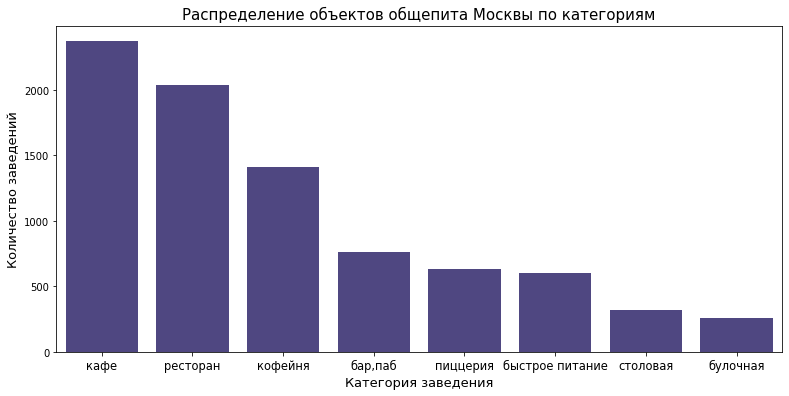

In [20]:
# сводная таблица распределения заведений по категориям
category_name = data.groupby('category')['name'].count().reset_index()\
                    .sort_values(by = 'name', ascending = False)
category_name.columns = ['Категория', 'Количество заведений']
category_name['Доля от общего количества, %'] = round(category_name['Количество заведений']/category_name['Количество заведений'].sum()*100,2)
display(category_name)

# строим столбчатую диаграмму распределения
plt.figure(figsize=(13, 6))

sns.barplot(y = 'Количество заведений',  x = 'Категория', data = category_name, color = 'darkslateblue')
plt.title('Распределение объектов общепита Москвы по категориям', size = 15)
plt.xlabel('Категория заведения', size = 13)
plt.ylabel('Количество заведений', size = 13)
plt.tick_params(axis='x', labelsize=11.5)  # размер шрифта в подписях столбиков
plt.show()

Из диаграммы видим, что более половины всех объектов общественного питания в Москве составляют кафе (28.3%) и рестораны (24.3%). Тройку лидеров замыкают кофейни, обеспечивая почти 17% московского рынка общепита. Четверть всех заведений приходится на бары, пиццерии и точки быстрого питания (фастфуд). Остальные категории - столовые и булочные - занимают 7% рынка.

### Распределение посадочных мест по категориям

Для наибольшей репрезентативности распределения сначала обратимся к описательным характеристикам параметра.

In [21]:
display(data['seats'].describe())

count    8394.000000
mean       61.798904
std       107.189751
min         0.000000
25%         0.000000
50%        20.000000
75%        85.000000
max      1288.000000
Name: seats, dtype: float64

Разброс значений действительно велик - от 0 до 1288 посадочных мест на одно заведение. До перехода к визуализации вижу необходимым скорретировать диапазон нормальных значений по категориям, ориентируясь на диаграммы размаха. Предварительно исключим из выборки заведения, не имеющие посадочных мест.

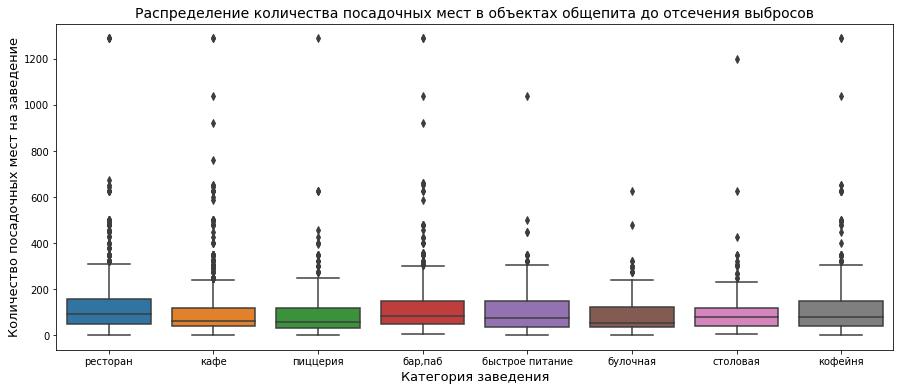

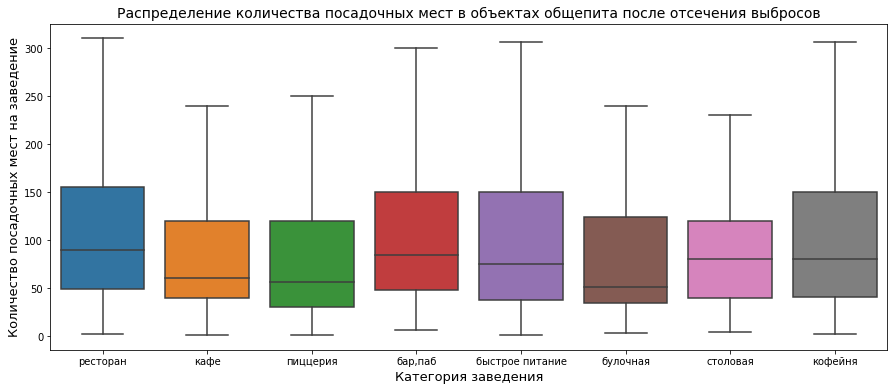

In [22]:
# срез данных по заведениям, у которых есть посадочные места
data_seats = data.query('seats != 0')

# Построим диаграммы размаха для анализа медианных значений количества посадочных мест
# и диапазона нормальных значений по каждой категории заведения

#Ящик с усами до отсечения выбросов
plt.figure(figsize=(15, 6))
sns.boxplot(x = data_seats['category'], y = data_seats['seats'])
plt.title('Распределение количества посадочных мест в объектах общепита до отсечения выбросов', size = 14)
plt.xlabel('Категория заведения', size = 13)
plt.ylabel('Количество посадочных мест на заведение', size = 13)
plt.show();

#Ящик с усами после отсечения выбросов
plt.figure(figsize=(15, 6))
sns.boxplot(x = data_seats['category'], y = data_seats['seats'], showfliers=False)
plt.title('Распределение количества посадочных мест в объектах общепита после отсечения выбросов', size = 14)
plt.xlabel('Категория заведения', size = 13)
plt.ylabel('Количество посадочных мест на заведение', size = 13)
plt.show();

In [23]:
# сводная таблица распределения посадочных мест по категориям
category_seats = (data_seats
                .pivot_table(index='category', values='seats', aggfunc='median')
                .sort_values(by='seats', ascending=False)
                .reset_index())

# строим столбчатую диаграмму распределения
fig = px.bar(category_seats,
             x='seats', #столбец с данными для оси X
             y='category', #столбец с данными для оси Y
             text='seats', # отображение подписей данных внутри столбцов
            template = 'seaborn'
            )
# оформляем график
fig.update_layout(title='Медианное количество посадочных мест в объектах общепита по категориям',
                  title_x=0.5,
                   xaxis_title='Количество посадочных мест',
                   yaxis_title='Категория заведения',
                  yaxis={'categoryorder':'total ascending'}, # сортировка по убыванию
                 template = 'plotly_white')
fig.show();

Наиболее вместительными точками общественного питания в Москве оказались рестораны (90 мест), бары (84 места), а также столовые и кофейни (по 80 мест, соответственно). При этом на диаграммах размаха фиксируются большие выбросы по всем категориям вплоть до 1200 мест на заведение. Данная аномалия может быть связана с учетом общей зоны фудкортов в торговых центрах и прочих открытых пространствах, где размещены точки общепита.

Меньше всего посадочных мест для гостей предлагается в булочных, так как этот тип заведений преимущественно ориентирован на работу в формате take away, чем на длительное пребывание клиентов.

### Соотношение сетевых и несетевых заведений

,Сетевой признак,Количество заведений
0,False,5189
1,True,3205


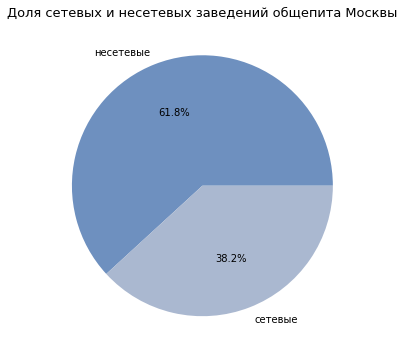

In [24]:
# сводная таблица соотношения количества сетевых и несетевых заведений
data_chain = data.pivot_table(index='chain',values='name', aggfunc='count').reset_index()
data_chain.columns = ['Сетевой признак', 'Количество заведений']
display(data_chain)

# строим круговую диаграмму
data_chain.plot(kind = 'pie', y='Количество заведений', labels = ['несетевые', 'сетевые'], figsize=(6, 6), label = '', autopct='%1.1f%%', colors = sns.color_palette("vlag"))
plt.title('Доля сетевых и несетевых заведений общепита Москвы', size = 13)
plt.legend().set_visible(False)
plt.show();

Из диаграммы видим, что 62% точек общественного питания не принадлежат ни к одной сети.

### Категории сетевых заведений

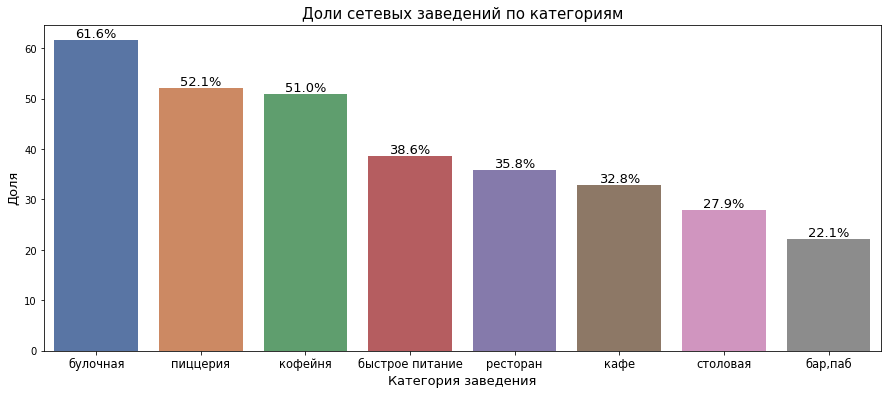

In [57]:
# сводная таблица распределения сетевых заведений по категориям
category_chain = (data.query('chain == True')
                  .pivot_table(index = 'category', values = 'name', aggfunc = 'count')
                  .sort_values(by = 'name', ascending = False)
                  .reset_index())
category_chain.columns = ['Категория', 'Количество сетевых заведений']

# объединяем таблицы 'category_name' и 'category_chain' по общему полю 'Категория'
category_chain_rate = category_chain.merge(category_name, how='inner', on='Категория').drop(['Доля от общего количества, %'], axis=1)
category_chain_rate['Доля сетевых заведений в общем количестве по категории'] = round(category_chain_rate['Количество сетевых заведений']/ category_chain_rate['Количество заведений'] *100, 1)
category_chain_rate = category_chain_rate.sort_values(by = 'Доля сетевых заведений в общем количестве по категории', ascending = False)

# строим столбчатую диаграмму
plt.figure(figsize=(15, 6))
ax = sns.barplot(y = 'Доля сетевых заведений в общем количестве по категории', x = 'Категория', data = category_chain_rate, palette='deep')

#оформляем график

for p in ax.patches: # добавим подписи столбиков
    ax.annotate('{:.1f}%'.format(p.get_height()),
                   (p.get_x() + p.get_width() / 2., p.get_height()),
                   ha = 'center', va = 'center',
                   xytext = (0, 6),
                   textcoords = 'offset points', size=13)

plt.title('Доли сетевых заведений по категориям', size = 15)
plt.ylabel('Доля', size = 13)
plt.xlabel('Категория заведения', size = 13)
plt.tick_params(axis='x', labelsize=11.5)
plt.show();

Основная часть заведений общественного питания Москвы не являются сетевыми. В самых крупных категориях - кафе и рестораны - количество сетевых заведений в 2 раза меньше частных.\
Тем не менее, для таких категорий, как кофейни, пиццерии и булочные, наблюдается перевес доли сетевых объектов общепита над частными. Это можно объяснить тем, что для данных сегментов в значительной степени характерна практика покупки франшизы с предоставлением права работать под известным брендом и использовать его уникальные технологии, задействуя относительно небольшие вложения.

### Топ-15 популярных сетей

Составим перечень из 15 наиболее популярных сетей общественного питания Москвы. Под популярностью понимается количество заведений сети в данном регионе.

In [26]:
# топ-15 популярных сетевых заведений
top_15_chain = (data[data['chain'] == True]
                .pivot_table(index = 'name', values = 'chain', aggfunc = 'count')
                .sort_values(by = 'chain', ascending = False)
                .reset_index()
                .head(15))
top_15_chain.columns = ['Название сети', 'Количество заведений']

# сводная таблица распределения топ-15 сетевых заведений по названиям и категориям
top_15_chain_name = (data.query('name in @top_15_chain["Название сети"]')
                .pivot_table(index = ['category', 'name'], values = 'chain', aggfunc = 'count')
                .sort_values(by = 'chain', ascending = False)
                .reset_index()
                .head(15))
top_15_chain_name.columns = ['Категория', 'Название сети', 'Количество сетевых заведений']

# построим диаграмму "солнечные лучи"
fig = px.sunburst(top_15_chain_name,
                  path = ['Категория', 'Название сети'], #слои лучей (от центра к краю)
                  values  = 'Количество сетевых заведений',
                  height = 600, width = 800,
                  hover_data = ['Количество сетевых заведений'],
                 color_discrete_sequence=px.colors.sequential.thermal)

# оформляем график
fig.update_layout(margin = dict(t = 35, l = 10, r = 10, b = 10), # задаем отступы для полей
                  title_text = 'Топ-15 популярных сетей общепита в Москве по категориям',
                  title_x = 0.5)
fig.show()

In [27]:
# сводная таблица соотношения количества сетевых заведений по категориям

top_15_chain = (top_15_chain_name.drop(['Название сети'], axis = 1)
                .groupby('Категория')
                .agg({'Количество сетевых заведений': 'sum'})
                .sort_values(by = 'Количество сетевых заведений', ascending = False)
                .reset_index())
        
top_15_chain['Доля от общего количества, %'] = round(top_15_chain['Количество сетевых заведений'] / top_15_chain['Количество сетевых заведений'].sum()*100, 2)
display(top_15_chain)

,Категория,Количество сетевых заведений,"Доля от общего количества, %"
0,кофейня,329,43.40
1,ресторан,169,22.30
2,пиццерия,151,19.92
3,кафе,84,11.08
4,булочная,25,3.30


Почти половину рынка сетевого общепита Москвы занимают кофейни (43.4%) с абсолютным лидерством торговой марки Шоколадница (более 100 заведений). Значительная доля кофеен обусловлена ростом популярности формата "grab-and-go" в условиях быстрого темпа жизни в большом городе - когда нет возможности тратить часы на приготовление еды, но есть желание приобрести свежее домашнее блюдо.\
Около 20% сетевого рынка приходится на категории ресторанов и пиццерий. Меньше всего сетей общественного питания наблюдается в категории булочных - всего 3% рынка.\
Главным признаком, объединяющим все сетевые заведения, является политика умеренных цен, доступных широкому кругу потребителей. Несмотря на ежегодный прирост себестоимости оказываемых услуг, московские заведения, во многом ориентированные на европейскую и восточную кухню, часто привлекают местных поставщиков для сокращения издержек при сохранении качества продукции.

### Распределение заведений по административным районам

Проверим перечень административных районов, по которым имеются данные.

In [28]:
# список административных районов
display(data['district'].unique())
print('Всего административных районов в датасете:', data['district'].nunique())

array(['Северный административный округ',
       'Северо-Восточный административный округ',
       'Северо-Западный административный округ',
       'Западный административный округ',
       'Центральный административный округ',
       'Восточный административный округ',
       'Юго-Восточный административный округ',
       'Южный административный округ',
       'Юго-Западный административный округ'], dtype=object)

Всего административных районов в датасете: 9


Добавим сокращения для удобства визуализации распределения по районам.

In [29]:
# добавим столбец с сокращаем 'административный округ' до 'АО'
data['district_abbr'] = data['district'].str.replace('административный округ','АО')

In [30]:
# сводная таблица распределения заведений по районам и категориям
category_district = (data.groupby(['district_abbr', 'category'], as_index=False)
                     .agg({'name' : 'count'})
                     .sort_values(by = 'name', ascending = False))
category_district.columns = ['Район', 'Категория', 'Количество заведений']

# строим столбчатую диаграмму
fig = px.bar(category_district,
             x='Количество заведений',
             y='Район',
             template='seaborn',                    
             color='Категория')

# оформляем график
fig.update_layout(title='Количество заведений по районам и категориям',
                  title_x = 0.5,
                   xaxis_title='Количество заведений',
                   yaxis_title='Административный район', 
                  yaxis={'categoryorder':'total ascending'}, # сортировка столбиков по убыванию
                template = 'plotly_white')

fig.show()

In [31]:
# сводная таблица соотношения количества заведений по районам

district_count = (category_district.drop(['Категория'], axis = 1)
                .groupby('Район')
                .agg({'Количество заведений': 'sum'})
                .sort_values(by = 'Количество заведений', ascending = False)
                .reset_index())
        
district_count['Доля от общего количества, %'] = round(district_count['Количество заведений'] / district_count['Количество заведений'].sum()*100, 2)
display(district_count)

,Район,Количество заведений,"Доля от общего количества, %"
0,Центральный АО,2241,26.70
1,Северный АО,896,10.67
2,Южный АО,891,10.61
3,Северо-Восточный АО,890,10.60
4,Западный АО,848,10.10
5,Восточный АО,798,9.51
6,Юго-Восточный АО,713,8.49
7,Юго-Западный АО,708,8.43
8,Северо-Западный АО,409,4.87


В датафрейме собрана информация о заведениях, расположенных в границах 9 административных районов Москвы.\
По диаграмме сильнее всего выделяется Центральный административный округ, в котором зарегистрировано более 2 тысяч заведений или 26.7% всех заведений города. Рестораны, кафе и кофейни составляют 70% от общего количества объектов общепита района. Высокая плотность заведений в центральном районе Москвы объясняется тем, что именно здесь сосредоточена наиболее активная жизнь города: туристические маршруты, деловая, научная и образовательная деятельность, торговые центры,а также объекты культурного и исторического наследия. В частности, самые популярные точки ресторанного бизнеса расположены в районе Патриарших прудов и Большой Никитской улицы.\
Менее всего привлекателен для бизнеса Северо-Западный административный округ - всего 4% рынка общепита. Данную закономерность можно связать со значительной удаленностью района от центра Москвы, низкой плотностью населения и низким уровнем покрытия метро в этом районе, что сильно влияет на доступность локации для потенциальных клиентов.\
При этом такие категории, как рестораны и кафе, демонстрируют стабильно хорошее распределение, обеспечивая около половины всех заведений в разбивке по каждому округу Москвы.

### Распределение средних рейтингов по категориям заведений

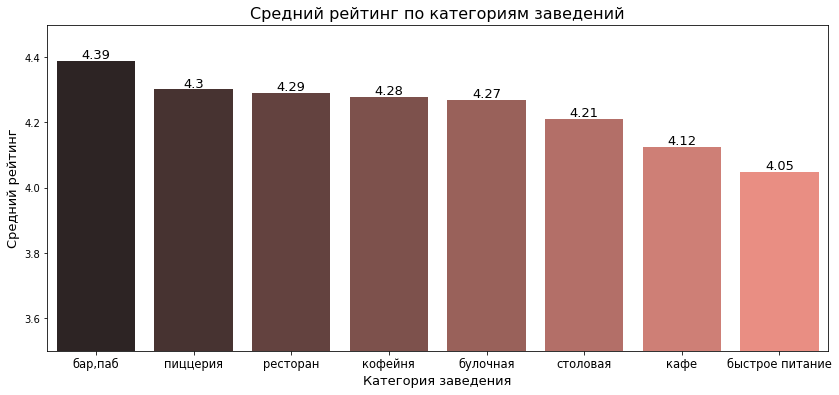

In [32]:
# сводная таблица распределения средних рейтингов по категориям

category_rating = (data.groupby('category', as_index=False)
                   .agg({'rating' : 'mean'})
                   .sort_values(by = 'rating', ascending = False))

category_rating.columns = ['Категория', 'Средний рейтинг']

# строим столбчатую диаграмму
plt.figure(figsize=(14, 6))
ax = sns.barplot(data = category_rating, x = 'Категория', y = 'Средний рейтинг', palette = "dark:salmon")

#оформляем график

ax.set_title('Средний рейтинг по категориям заведений', fontsize=16)
ax.set_ylabel('Средний рейтинг', fontsize=13)
ax.set_xlabel('Категория заведения', fontsize=13)
ax.set_ylim(3.5, 4.5)

for p in ax.patches: # добавим подписи столбиков
    ax.annotate(format(p.get_height().round(2), ',').replace(',', ' '),
                   (p.get_x() + p.get_width() / 2., p.get_height()),
                   ha = 'center', va = 'center',
                   xytext = (0, 6),
                   textcoords = 'offset points', size=13)

plt.tick_params(axis='x', labelsize=11.5)
plt.show();

Самый высокий рейтинг заведений фиксируется для баров и пабов - в среднем 4.39. Высокие оценки можно связать с ситуативным форматом отдыха посетителей в данном типе заведений, принимая во внимание особую атмосферу, индивидуальный подход к клиенту, авторский дизайн интерьера, живую музыку и разнообразие алкоголя.\
Хорошие показатели характерны также для пиццерий, ресторанов, кофеен и булочных - средний рейтинг варьируется от 4.27 до 4.3.\
Наиболее слабые рейтинги отводятся точкам быстрого питания (4.05) и кафе (4.12). Причинами могут быть отсутствие сервиса, проблемы, связанные с низким качеством, либо неправильным хранением пищевой продукции, антисанитарными условиями и прочими факторами, которые влияют на удовлетворенность и лояльность посетителей при выборе бюджетного заведения.

### Распределение средних рейтингов по административным округам

Для сопоставления средних рейтингов заведений по районам Москвы построим фоновую картограмму (хороплет). Границы районов Москвы хранятся в файле 'admin_level_geomap.geojson'.

In [33]:
# сводная таблица распределения средних рейтингов по районам
rating_district = (data.groupby('district', as_index=False)
                   .agg({'rating' : 'mean'})
                   .round(2)
                   .sort_values(by = 'rating', ascending = False))

display(rating_district)

,district,rating
5,Центральный административный округ,4.38
2,Северный административный округ,4.24
4,Северо-Западный административный округ,4.21
1,Западный административный округ,4.18
8,Южный административный округ,4.18
0,Восточный административный округ,4.17
7,Юго-Западный административный округ,4.17
3,Северо-Восточный административный округ,4.15
6,Юго-Восточный административный округ,4.10


In [34]:
# загружаем JSON-файл с границами округов Москвы
state_geo_url = 'https://code.s3.yandex.net/data-analyst/admin_level_geomap.geojson'

response = requests.get(state_geo_url)
state_geo = response.json()

# создаем словарь для быстрого поиска рейтинга по районам
rating_dict = dict(zip(rating_district['district'], rating_district['rating']))

for feature in state_geo['features']:
    district_name = feature['properties']['name']
    feature['properties']['rating'] = rating_dict.get(district_name, 'Нет данных')

# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423    

# создаем пустую карту Москвы для наполнения данными
m = folium.Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles = 'Cartodb Positron')

#создаем хороплет
folium.Choropleth(
    geo_data=state_geo,
    name="choropleth",
    data=rating_district,
    columns=["district", "rating"],
    key_on="feature.properties.name",  # уточнение пути к полю
    fill_color="YlGn",
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name="Рейтинг заведений",
).add_to(m)

# добавляем подписи при наведении курсора
folium.GeoJson(
    state_geo,
    name="geojson",
    tooltip=folium.features.GeoJsonTooltip(
        fields=['name', 'rating'],  #поле из GeoJSON для отображения
        aliases=['Район: ', 'Рейтинг: '], #псевдонимы для полей
        localize=True
    ),
    popup=folium.GeoJsonPopup(
        fields=['name', 'rating'], #поле из GeoJSON для отображения
        aliases=['Район: ', 'Рейтинг: '], #псевдонимы для полей
        localize=True
    )
).add_to(m)

display(m)

Наиболее высокие рейтинги принадлежат заведениям из Центрального административного округа - в среднем 4.38. Это обусловлено большой конкуренцией между ресторанами, обладающими авторской концепцией, за внимание обеспеченных горожан. Поэтому именно в центре Москвы размещаются заведения премиум-класса, привлекающие максимум ресурсов для поддержания своего рейтинга и соответствующей прибыли.\
Наименьшие рейтинги относятся к Юго-Восточному административному округу со средней оценкой 4.1.

### Распределение заведений на карте

Теперь отобразим все заведения московского общепита на карте.

In [35]:
# создаем пустую карту Москвы для наполнения данными
m2 = folium.Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles = 'Cartodb Positron')


# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m2)

# функция, которая принимает строку датафрейма,
# создаёт маркер в текущей точке,
# выводит название объекта и его рейтинг
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data.apply(create_clusters, axis=1)

# выводим карту
display(m2)

По карте фиксируем следующиее наблюдение: больше всего точек общественного питания Москвы концентрируется в центре, меньше всего - на окраинах города и особенно на юге. В то же время подобное представление данных является сильно укрупненным и носит скорее ознакомительный характер.

### Распределения заведений на топ-15 улицах по категориям

Составим перечень топ-15 улиц Москвы по количеству заведений, затем визуализируем распределение заведений на этих улицах по категориям.

In [36]:
# количество заведений на каждую улицу из топ-15
top_15_street = (data
                .pivot_table(index = 'street', values = 'name', aggfunc = 'count')
                .sort_values(by = 'name', ascending = False)
                .reset_index()
                .head(15))
top_15_street.columns = ['Название улицы', 'Количество заведений']
display(top_15_street)

# сводная таблица распределения заведений по улицам и категориям
streets_category = (data
                    .groupby(['street', 'category'], as_index=False)
                    .agg({'name' : 'count'})
                    .sort_values(by = 'name', ascending = False))
streets_category.columns = ['Название улицы', 'Категория', 'Количество заведений']

# объединяем таблицы по общему полю 'название улицы'
top_15_street_category_name = streets_category.merge(top_15_street, how='inner', on='Название улицы')
top_15_street_category_name.columns = ['Название улицы', 'Категория', 'Количество заведений в категории', 'Всего заведений на улице']

,Название улицы,Количество заведений
0,проспект мира,183
1,профсоюзная улица,122
2,проспект вернадского,108
3,ленинский проспект,107
4,ленинградский проспект,95
5,дмитровское шоссе,88
6,каширское шоссе,77
7,варшавское шоссе,76
8,ленинградское шоссе,70
9,мкад,65


In [37]:
# строим столбчатую диаграмму
fig = px.bar(top_15_street_category_name,
            x = 'Количество заведений в категории',
             y = 'Название улицы',
             color = 'Категория',
            template='seaborn')

# оформляем график
fig.update_layout(title='Количество заведений каждой категории по топ-15 улицам Москвы',
                  title_x = 0.5,
                   xaxis_title='Количество заведений',
                   yaxis_title='Название улицы', 
                  yaxis={'categoryorder':'total ascending'}, # сортировка столбиков по убыванию
                template = 'plotly_white',
                 height = 600)

fig.show()

Из диаграммы видим, что основная масса заведений общественного питания Москвы расположена на проспекте Мира - 183 заведения, среди которых половину составляют кафе и рестораны. В целом распределение категорий заведений по топ-15 улицам соответствует общегородской тенденции. Однако в общем списке улиц заметно выделяется МКАД, где кафе составляют 70% от общего количества объектов общепита с сохранением минимальной доли всех остальных категорий.

Меньше всего заведений фиксируется на улицах Миклухо-Маклая и Пятницкой - менее 50 заведений на каждую улицу.

В целом плотность размещения заведений на той или иной улице обусловлена такими факторами, как проходимость, заметность, активность конкурентов,  наличие технически пригодного помещения для аренды и способность эффективно работать в течение всего года.

### Улицы, на которых расположено не более одного объекта общепита

In [38]:
# делаем срез данных по улицам с 1 заведением по районам
street_one_name = data['street'].value_counts().reset_index()
street_one_name.columns = ['Название улицы', 'Количество заведений']
street_one_name = street_one_name[street_one_name['Количество заведений'] == 1]

print('\033[1m' + 'Общее количество улиц Москвы с 1 заведением:' + '\033[0m', street_one_name['Количество заведений'].count())
display(street_one_name['Название улицы'].unique())

Общее количество улиц Москвы с 1 заведением: 457


array(['старый петровско-разумовский проезд', 'пожарский переулок',
       'новороссийская улица', 'беговая аллея', 'улица ильинка',
       'павелецкая набережная', 'кооперативная улица', 'улица пивченкова',
       'сумской проезд', 'нащокинский переулок', '1-й варшавский проезд',
       'малая тульская улица', 'бутиковский переулок',
       'большой кисловский переулок', 'зубарев переулок',
       '2-й красносельский переулок', 'графский переулок',
       'улица старые кузьминки', 'улица артюхиной',
       'малый гнездниковский переулок', 'алтайская улица',
       '9-я улица соколиной горы', 'ступинский проезд',
       'сквер имени м.и. калинина', 'малая красносельская улица',
       'парк имени артёма боровика', 'улица полины осипенко',
       'уссурийская улица', 'мурановская улица',
       'улица всеволода вишневского', 'челобитьевское шоссе',
       'ленинский проспект (дублёр)', 'молдавская улица',
       '1-я фрунзенская улица', 'прибрежный проезд', 'кузьминская улица',
       '

,Административный район,Количество улиц с 1 заведением,"Доля от общего количества, %"
0,Центральный АО,145,31.73
1,Северо-Восточный АО,55,12.04
2,Восточный АО,52,11.38
3,Северный АО,51,11.16
4,Южный АО,43,9.41
5,Юго-Восточный АО,39,8.53
6,Западный АО,35,7.66
7,Северо-Западный АО,19,4.16
8,Юго-Западный АО,18,3.94


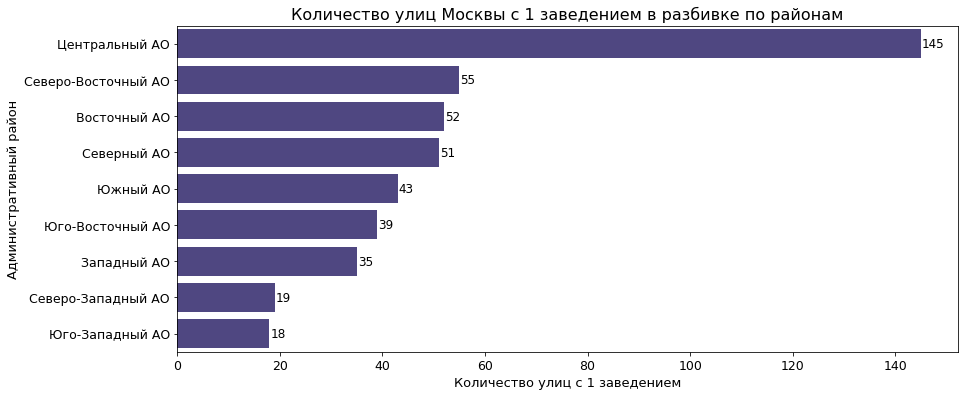

In [39]:
#сводная таблица количества улиц с 1 заведением в разбивке по районам
district_category_one_name = (data.query('street in @street_one_name["Название улицы"]')
                    .pivot_table(index = 'district_abbr', values = 'street', aggfunc = 'count')
                     .sort_values(by= 'street', ascending = False)
                    .reset_index())
district_category_one_name.columns = ['Административный район','Количество улиц с 1 заведением']
district_category_one_name['Доля от общего количества, %'] = \
round(district_category_one_name['Количество улиц с 1 заведением'] / district_category_one_name['Количество улиц с 1 заведением'].sum()*100, 2)
display(district_category_one_name)

# строим столбчатую диаграмму
plt.figure(figsize=(14, 6))
ax = sns.barplot(data = district_category_one_name, x = 'Количество улиц с 1 заведением', y = 'Административный район', color = 'darkslateblue')

#оформляем график

ax.set_title('Количество улиц Москвы с 1 заведением в разбивке по районам', fontsize=16)
ax.set_ylabel('Административный район', fontsize=13)
ax.set_xlabel('Количество улиц с 1 заведением', fontsize=13)

# добавим подписи столбиков
for p in ax.patches:
        ax.annotate(format(int(p.get_width()), ',').replace(',', ' '),
        (p.get_x() + p.get_width() + 0.2, p.get_y()  +0.5),
        size = 12)

plt.tick_params(axis='both', labelsize=12.5) # размер подписей районов и значений по оси x
plt.show();

В Москве насчитывается 457 улиц, на которых находится по одному заведению общественного питания. В основном такие точки расположены в Центральном административном округе (32% заведений), то есть в черте "старой" Москвы. Это обусловлено, в первую очередь, особенностями исторической застройки центра города, где много небольших улиц. Так, например, в названиях часто упоминаются такие типы улиц, как "проезд", "переулок", "тупик", "бульвар", "линия", "сквер", "площадь", что говорит о том, что это улицы малой протяженности.

### Политика среднего чека заведений по административным округам

Для выявления особенностей ценообразования на рынке общепита посчитаем медиану среднего чека заведений для каждого адинистративного округа Москвы. Затем используем это значение в качестве ценового индикатора округа при построении фоновой картограммы (хороплета).

In [40]:
# сводная таблица распределения среднего чека по административным округам
district_avg_bill = (data.query('middle_avg_bill != -1')
                    .pivot_table(index = 'district', values = 'middle_avg_bill', aggfunc = 'median')
                     .sort_values(by= 'middle_avg_bill', ascending = False)
                    .reset_index())
display(district_avg_bill)

,district,middle_avg_bill
0,Западный административный округ,1000.0
1,Центральный административный округ,1000.0
2,Северо-Западный административный округ,700.0
3,Северный административный округ,650.0
4,Юго-Западный административный округ,600.0
5,Восточный административный округ,575.0
6,Северо-Восточный административный округ,500.0
7,Южный административный округ,500.0
8,Юго-Восточный административный округ,450.0


In [41]:
# создаем словарь для быстрого поиска значений среднего чека по районам
avg_bill_dict = dict(zip(district_avg_bill['district'], district_avg_bill['middle_avg_bill']))

for feature in state_geo['features']:
    district_name = feature['properties']['name']
    feature['properties']['middle_avg_bill'] = avg_bill_dict.get(district_name, 'Нет данных') 

# создаем пустую карту Москвы для наполнения данными
m3 = folium.Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles = 'Cartodb Positron')

#создаем хороплет
folium.Choropleth(
    geo_data=state_geo,
    name="choropleth",
    data=district_avg_bill,
    columns=["district", "middle_avg_bill"],
    key_on="feature.properties.name",  # уточнение пути к полю
    fill_color="YlGn",
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name="Средний чек",
).add_to(m3)

# добавляем подписи при наведении курсора
folium.GeoJson(
    state_geo,
    name="geojson",
    tooltip=folium.features.GeoJsonTooltip(
        fields=['name', 'middle_avg_bill'],  #поле из GeoJSON для отображения
        aliases=['Район: ', 'Средний чек: '], #псевдонимы для полей
        localize=True
    ),
    popup=folium.GeoJsonPopup(
        fields=['name', 'middle_avg_bill'], #поле из GeoJSON для отображения
        aliases=['Район: ', 'Средний чек: '], #псевдонимы для полей
        localize=True
    )
).add_to(m3)

display(m3)

По карте видим, что самые дорогие заведения относятся к Центральному и Западному административным округам: средний чек в этих зонах составляет 1 тысячу рублей.\
Высокий средний чек в центре Москвы связан с премиальным сервисом, уникальной концепцией  и авторской кухней, предлагаемыми для посетителей заведений. В свою очередь, запад Москвы считается одним из самых престижных направлений среди туристов и местом отдыха для состоятельных горожан, что, конечно, напрямую влияет на ценовой сегмент открываемых заведений.\
Наиболее бюджетные заведения располагаются в южных и восточных районах города - здесь средний чек варьируется от 450 до 600 рублей. В целом в Москве работает общее правило снижения среднего чека при увеличении удаленности заведения от центра, за исключением элитных районов города.

**Выводы по анализу данных о заведениях общественного питания Москвы**
1. `Категории заведений:` 

Большую часть объектов общественного питания в Москве составляют **кафе** (28.3%) и **рестораны** (24.3%). Тройку лидеров замыкают **кофейни**, обеспечивая почти 17% московского рынка общепита. Четверть всех заведений приходится на бары, пиццерии и точки быстрого питания (фастфуд). Остальные категории - столовые и булочные - занимают 7% рынка.

2. `Количество посадочных мест:`

*Наиболее вместительные точки общественного питания в Москве: рестораны (90 мест), бары (84 места), а также столовые и кофейни (по 80 мест, соответственно).* Меньше всего посадочных мест для гостей предлагается в булочных, так как этот тип заведений ориентирован на работу в формате "take away", чем на длительное пребывание клиентов.

3. `Сетевые VS частные заведения:`

*62% заведений общественного питания не принадлежат ни к одной сети*. В самых популярных категориях - кафе и рестораны - количество сетевых заведений в 2 раза меньше частных.\
Тем не менее, для таких типов заведений, как кофейни, пиццерии и булочные, наблюдается перевес доли сетевых объектов над частными. Это можно объяснить тем, что для данных сегментов характерна практика покупки франшизы с предоставлением права работать под известным брендом и использовать его уникальные технологии, задействуя относительно небольшие вложения.

4. `Особенности сетевого общепита:`

Почти *половину рынка сетевого общепита Москвы занимают кофейни (43.4%)* с абсолютным лидерством торговой марки **Шоколадница** (более 100 заведений). Значительная доля кофеен обусловлена ростом популярности формата "grab-and-go" в условиях быстрого темпа жизни в большом городе - когда нет возможности тратить часы на приготовление еды, но есть желание приобрести свежее домашнее блюдо.\
Около 20% сетевого рынка приходится на категории ресторанов и пиццерий. Меньше всего сетей фиксируется для категории булочных - всего 3% рынка.\
*Главный признак, объединяющий все сетевые заведения, - политика умеренных цен*, доступных широкому кругу потребителей. Несмотря на ежегодный прирост себестоимости оказываемых услуг, московские заведения, во многом ориентированные на европейскую и восточную кухню, часто привлекают местных поставщиков для сокращения издержек при сохранении качества продукции.

5. `Территориальное распределение заведений:`

Самая насыщенная зона с заведениями общественного питания в Москве - **Центральный административный округ**, на который приходится более 2 тысяч заведений или 26.7% всего общепита города. Рестораны, кафе и кофейни составляют 70% от общего количества объектов общепита округа. Высокая плотность заведений в центральном районе Москвы объясняется тем, что именно здесь сосредоточена наиболее активная жизнь города: туристические маршруты, деловая, научная и образовательная деятельность, торговые центры, а также объекты культурного и исторического наследия. В частности, самые популярные точки ресторанного бизнеса расположены в районе Патриарших прудов и Большой Никитской улицы.\
Наименее привлекательный для бизнеса округ - Северо-Западный, занимающий всего 4% рынка московского общепита. Данную закономерность можно связать со значительной удаленностью района от центра Москвы, низкой плотностью населения и низким уровнем покрытия метро в этом районе, что сильно влияет на доступность локации для потенциальных клиентов.\
Что касается топ-15 наиболее привлекательных для общепита улиц, основная масса заведений расположена на **проспекте Мира** - 183 заведения, среди которых половину составляют кафе и рестораны. В целом распределение категорий заведений по топ-15 улицам соответствует общегородской тенденции. Однако в общем списке заметно выделяется МКАД, где кафе составляют 70% от общего количества объектов общепита с сохранением минимальной доли всех остальных категорий.\
Меньше всего заведений отмечается на улицах Миклухо-Маклая и Пятницкой - до 50 заведений на каждую улицу.\
В целом плотность размещения заведений на той или иной улице обусловлена такими факторами, как проходимость, заметность, наличие парковки, активность конкурентов, наличие технически пригодного помещения для аренды и способность эффективно работать в течение всего года.

6. `Рейтинги заведений:`

*Самый высокий рейтинг принадлежит категории баров и пабов* - в среднем 4.39. Высокие оценки можно связать с ситуативным форматом отдыха посетителей данного типа заведения, принимая во внимание особую атмосферу, индивидуальный подход к клиенту, авторский дизайн интерьера, живую музыку и разнообразие алкоголя.\
Хорошие показатели характерны также для пиццерий, ресторанов, кофеен и булочных - средний рейтинг варьируется от 4.27 до 4.3.\
Самые низкие оценки отводятся точкам быстрого питания (4.05) и кафе (4.12). Причинами могут быть отсутствие сервиса, проблемы, связанные с низким качеством, либо неправильным хранением пищевой продукции, антисанитарными условиями и прочими факторами, которые влияют на удовлетворенность и лояльность посетителей при выборе бюджетного заведения.\
Что касается территориальной размещения, заведения-лидеры рейтингов закономерно концентрируются в центре Москвы (средняя оценка заведений в Центральном округе - 4.38). Это обусловлено большой конкуренцией между авторскими ресторанами за внимание обеспеченных горожан. Поэтому именно в центре Москвы открываются заведения премиум-класса, привлекающие максимум ресурсов для поддержания своего рейтинга и соответствующей прибыли.

7. `Особенности улиц, на которых расположено не более одного заведения:`

В Москве насчитывается 457 улиц, на которых находится по одному заведению общественного питания. В основном такие точки расположены в Центральном административном округе (32% заведений), то есть в радиусе "старой" Москвы. Это обусловлено, в первую очередь, особенностями исторической застройки центра города, где много небольших улиц. Так, например, в названиях таких улиц часто упоминаются "проезд", "переулок", "тупик", "бульвар", "линия", "сквер", "площадь", что говорит о том, что это улицы малой протяженности.

8. `Политика среднего чека по административным округам:`

*Наиболее дорогие заведения относятся к Центральному и Западному административным округам*: средний чек в этих зонах составляет 1 тысячу рублей.\
Высокий средний чек в центре Москвы связан с премиальным сервисом, уникальной концепцией и авторской кухней, предлагаемыми для посетителей заведений.\
В свою очередь, запад Москвы считается одним из самых престижных направлений среди туристов и местом отдыха для состоятельных горожан, что, конечно, напрямую влияет на ценовой сегмент открываемых заведений.\
Бюджетные заведения располагаются в южных и восточных районах города - здесь средний чек варьируется от 450 до 600 рублей. В целом для Москвы работает общее правило уменьшения среднего чека с увеличением удаленности заведения от центра, за исключением элитных районов города.

## Исследование рынка кофеен

Принимая во внимание интерес инвесторов к открытию заведения категории "кофейня", детализируем исследование и рассмотрим наиболее существенные вопросы функционирования кофеен на рынке общепита. Для этого изучим следующие параметры: 
- распределение кофеен по административным округам;
- время работы кофеен;
- распределение рейтингов кофеен по административным округам;
- ценовая политика для одной чашки капучино.

### Распределение кофеен по административным округам

In [42]:
# смотрим количество кофеен по районам
data_cafe = (data.query('category == "кофейня"')
             .pivot_table(index = 'district', values = 'name', aggfunc='count')
             .reset_index()
             .sort_values(by = 'name', ascending=False))
data_cafe.columns = ['Административный округ', 'Количество кофеен']
data_cafe['Доля от общего количества, %'] = \
round(data_cafe['Количество кофеен'] / data_cafe['Количество кофеен'].sum()*100, 2)
print('\033[1m' + 'Общее количество кофеен в Москве:' + '\033[0m', data_cafe['Количество кофеен'].sum())
display(data_cafe)

Общее количество кофеен в Москве: 1412


,Административный округ,Количество кофеен,"Доля от общего количества, %"
5,Центральный административный округ,428,30.31
2,Северный административный округ,193,13.67
3,Северо-Восточный административный округ,159,11.26
1,Западный административный округ,149,10.55
8,Южный административный округ,131,9.28
0,Восточный административный округ,105,7.44
7,Юго-Западный административный округ,96,6.80
6,Юго-Восточный административный округ,89,6.30
4,Северо-Западный административный округ,62,4.39


Отобразим распределение кофеен на фоновой картограмме (хороплете).

In [43]:
# создаем словарь для быстрого поиска значений среднего чека по районам
cafe_dict = dict(zip(data_cafe['Административный округ'], data_cafe['Количество кофеен']))

for feature in state_geo['features']:
    district_name = feature['properties']['name']
    feature['properties']['Количество кофеен'] = cafe_dict.get(district_name, 'Нет данных') 

# создаем пустую карту Москвы для наполнения данными
m4 = folium.Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles = 'Cartodb Positron')

#создаем хороплет
folium.Choropleth(
    geo_data=state_geo,
    name="choropleth",
    data=data_cafe,
    columns=["Административный округ", "Количество кофеен"],
    key_on="feature.properties.name",  # уточнение пути к полю
    fill_color="YlGn",
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name="Количество кофеен",
).add_to(m4)

# добавляем подписи при наведении курсора
folium.GeoJson(
    state_geo,
    name="geojson",
    tooltip=folium.features.GeoJsonTooltip(
        fields=['name', 'Количество кофеен'],  #поле из GeoJSON для отображения
        aliases=['Район: ', 'Количество кофеен: '], #псевдонимы для полей
        localize=True
    ),
    popup=folium.GeoJsonPopup(
        fields=['name', 'Количество кофеен'], #поле из GeoJSON для отображения
        aliases=['Район: ', 'Количество кофеен: '], #псевдонимы для полей
        localize=True
    )
).add_to(m4)

display(m4)

В нашем распоряжении есть информация о **1412 кофейнях Москвы**, 30% из которых находятся в Центральном административном округе. Далее идут Северный и Северо-Восточный округа, которые в совокупности образуют четверь московского рынка кофеен.\
Меньше всего кофеен расположено на северо-западе города. Данную закономерность можно связать со значительной удаленностью района от центра Москвы, низкой плотностью населения и низким уровнем покрытия метро в этом районе, что сильно влияет на доступность локации для потенциальных клиентов.

### Время работы кофеен

Проверим, сколько кофеен является круглосуточными, чтобы определить востребованность такого режима работы в будущем проекте.

In [44]:
print('Количество кофеен Москвы, работающих ежедневно и круглосуточно:', data[((data['category'] == "кофейня") & (data['is_24_7'] == True))]['is_24_7'].count())
print('Доля круглосуточных кофеен от общего количества: {0:.2%}'.format(data[((data['category'] == "кофейня") & (data['is_24_7'] == True))]['is_24_7'].count() / data[data['category'] == "кофейня"]['name'].count()))

Количество кофеен Москвы, работающих ежедневно и круглосуточно: 59
Доля круглосуточных кофеен от общего количества: 4.18%


Дополнительно посмотрим распределение круглосуточных кофеен по административным округам.

In [45]:
# сводная таблица распределения круглосуточных кофеен по районам
category_seats = (data.query('category == "кофейня" and is_24_7 == True')
                .pivot_table(index='district_abbr', values='name', aggfunc='count')
                .sort_values(by='name', ascending=False)
                .reset_index())

# строим столбчатую диаграмму распределения
fig = px.bar(category_seats,
             x='name', #столбец с данными для оси X
             y='district_abbr', #столбец с данными для оси Y
             text='name', # отображение подписей данных внутри столбцов
            template = 'seaborn'
            )
# оформляем график
fig.update_layout(title='Распределение круглосуточных кофеен Москвы по административным округам',
                  title_x=0.5,
                   xaxis_title='Количество кофеен',
                   yaxis_title='Административный район',
                  yaxis={'categoryorder':'total ascending'}, # сортировка по убыванию
                 template = 'plotly_white')
fig.show();

На основании проведенных расчетов можно сделать вывод, что круглосуточные кофейни не пользуются широкой популярностью среди жителей Москвы - всего 4% от общего количества кофеен. Основная доля круглосуточных кофеен находится в центре города, в то время как в остальных районах кофейни такого типа представлены в незначительном количестве.

### Распределение средних рейтингов кофеен по административным округам

Для сопоставления средних рейтингов кофеен по районам Москвы построим фоновую картограмму (хороплет).

In [46]:
# сводная таблица распределения средних рейтингов кофеен по районам
rating_district_cafe = (data.query('category == "кофейня"')
                        .groupby('district', as_index=False)
                        .agg({'rating' : 'mean'})
                        .round(2)
                        .sort_values(by = 'rating', ascending = False))
display(rating_district_cafe)

,district,rating
5,Центральный административный округ,4.34
4,Северо-Западный административный округ,4.33
2,Северный административный округ,4.29
0,Восточный административный округ,4.28
7,Юго-Западный административный округ,4.28
6,Юго-Восточный административный округ,4.23
8,Южный административный округ,4.23
3,Северо-Восточный административный округ,4.22
1,Западный административный округ,4.19


In [47]:
# создаем словарь для быстрого поиска рейтинга кофеен по районам
rating_cafe_dict = dict(zip(rating_district_cafe['district'], rating_district_cafe['rating']))

for feature in state_geo['features']:
    district_name = feature['properties']['name']
    feature['properties']['rating'] = rating_cafe_dict.get(district_name, 'Нет данных')

# создаем пустую карту Москвы для наполнения данными
m5 = folium.Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles = 'Cartodb Positron')

#создаем хороплет
folium.Choropleth(
    geo_data=state_geo,
    name="choropleth",
    data=rating_district_cafe,
    columns=["district", "rating"],
    key_on="feature.properties.name",  # уточнение пути к полю
    fill_color="YlGn",
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name="Рейтинг кофеен",
).add_to(m5)

# добавляем подписи при наведении курсора
folium.GeoJson(
    state_geo,
    name="geojson",
    tooltip=folium.features.GeoJsonTooltip(
        fields=['name', 'rating'],  #поле из GeoJSON для отображения
        aliases=['Район: ', 'Рейтинг: '], #псевдонимы для полей
        localize=True
    ),
    popup=folium.GeoJsonPopup(
        fields=['name', 'rating'], #поле из GeoJSON для отображения
        aliases=['Район: ', 'Рейтинг: '], #псевдонимы для полей
        localize=True
    )
).add_to(m5)

display(m5)

Разброс средних значений рейтинга кофеен Москвы не велик: оценки представлены в диапазоне от 4.19 до 4.34, что говорит о высоком уровне клиентского сервиса во всех районах города.\
Максимальный усредненный рейтинг отмечается в Центральном и Северо-Западном административных округах. Самые низкие оценки имеют кофейни в Западном административном округе.\
В целом рейтинги кофеен Москвы значительно выше общих рейтингов заведений по районам, за исключением Центрального округа, в котором высокие оценки достигаются преимущественно за счет атмосферных баров и ресторанов с уникальной авторской концепцией.

### Ценовая политика для одной чашки капучино

Проанализируем, на какую стоимость чашки капучино, как ключевого кофейного напитка, стоит ориентироваться при открытии заведения. Для этого рассчитаем медианное значение цен по каждому округу Москвы.

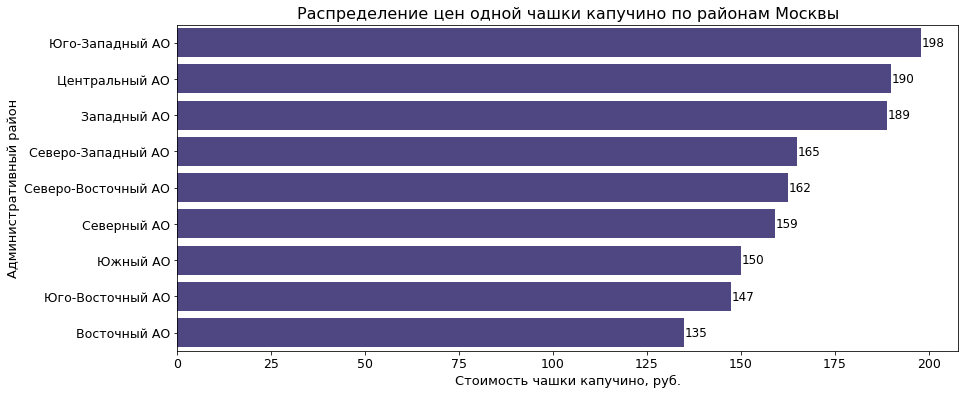

In [48]:
# сводная таблица распределения стоимости чашки капучино по районам
median_coffee_cup = (data.query('category == "кофейня" and middle_coffee_cup != -1')
                     .pivot_table(index = 'district_abbr', values='middle_coffee_cup', aggfunc='median')
                     .sort_values(by='middle_coffee_cup', ascending=False)
                     .reset_index())
median_coffee_cup.columns = ['Административный район', 'Стоимость чашки капучино']

# строим столбчатую диаграмму
plt.figure(figsize=(14, 6))
ax = sns.barplot(data = median_coffee_cup, x = 'Стоимость чашки капучино', y = 'Административный район', color = 'darkslateblue')

#оформляем график

ax.set_title('Распределение цен одной чашки капучино по районам Москвы', fontsize=16)
ax.set_ylabel('Административный район', fontsize=13)
ax.set_xlabel('Стоимость чашки капучино, руб.', fontsize=13)

# добавим подписи столбиков
for p in ax.patches:
        ax.annotate(format(int(p.get_width()), ',').replace(',', ' '),
        (p.get_x() + p.get_width() + 0.2, p.get_y()  +0.5),
        size = 12)

plt.tick_params(axis='both', labelsize=12.5) # размер подписей районов и значений по оси x
plt.show();

Самый дорогой капучино предлагают кофейни Юго-Западного, Центрального и Западного округов Москвы - средняя цена кофе варьируется от 190 до 198 рублей за одну чашку.\
Самый дешевый кофе продают в Восточном округе при сравнительно низкой плотности кофеен (7% от всего количества кофеен города) и достаточно высоких средних рейтингах заведений (4.28).\
В части проработки ценовой политики на старте рекомендуется устанавливать цену на кофе, исходя из средней цены по району, где планируется запуск кофейного проекта. Предварительно имеет смысл провести анализ конкурентов в этой зоне с поправкой на целевую аудиторию.

**Выводы о московском рынке кофеен:**

Проведен анализ данных о 1412 кофейнях Москвы,в результате которого выявлены следующие закономерности:
* 30% кофеен Москвы находятся в Центральном административном округе. Далее идут Северный и Северо-Восточный округа, которые в совокупности образуют четверть рынка кофеен. Меньше всего кофейных точек расположено на северо-западе города;
* Круглосуточные кофейни не пользуются широкой популярностью среди жителей Москвы - всего 4% от общего количества. Основная доля круглосуточных кофеен находится в центре города, в то время как в остальных районах кофейни такого типа представлены в незначительном количестве;
* Средние рейтинги кофеен лежат в диапазоне от 4.19 до 4.34, что говорит о высоком уровне клиентского сервиса во всех районах города. Максимальные оценки фиксируются в Центральном и Северо-Западном административных округах. Самые низкие - в Западном административном округе. В целом рейтинги кофеен Москвы значительно выше общих рейтингов заведений по районам;
* Самый дорогой капучино предлагают кофейни Юго-Западного, Центрального и Западного округов Москвы - средняя цена кофе варьируется от 190 до 198 рублей за одну чашку. Самый дешевый кофе продают в Восточном округе при сравнительно низкой плотности кофеен (7% от всего количества кофеен города) и достаточно высоких рейтингах заведений (4.28).

**Рекомендации по открытию кофейни:**

1. `Оптимальное местоположение`

Выгодное местоположение заведения - залог успеха для любого нового проекта общественного питания. В качестве наиболее перспективного района для планирования кофейного бизнеса предлагается рассмотреть Западный административный округ. Для этой зоны Москвы отмечаются самые низкие рейтинги заведений при высокой стоимости чашки капучино.\
В качестве альтернативы можно обратить внимание на Северо-Восточный округ, для которого характерны низкие оценки и средний прайс на кофе.\
В обоих случаях ключевой вектор развития для новой кофейни - выстраивание индивидуального подхода к клиенту в сочетании с высоким уровнем сервиса.

2. `Ценовой сегмент`

На этапе проработки ценовой политики заведения рекомендуется устанавливать цену на кофе, исходя из средней цены по району, где планируется запуск кофейного проекта. Предварительно имеет смысл провести анализ конкурентов в зоне размещения с поправкой на предпочтения и платежеспособность целевой аудитории.

3. `Время работы`

Круглосуточные кофейни наиболее востребованы только в центре города, что обусловлено широким разнообразием мероприятий в контексте ночной жизни центра Москвы. Однако в случае планирования кофейни в отдаленных от центра районах, круглосуточный формат видится экономически необоснованным. Поэтому в данном случае рекомендуется придерживаться дневного режима работы.

Помимо обозначенных вопросов, владельцам будущей кофейни предстоит углубленно погрузиться в особенности кофейной ниши, включая изучение тонкостей различных сортов кофе, их характеристик, методов обжарки и приготовления. В части выбора помещения необходимо учесть пешеходный трафик, заметность заведения и составить его дизайн-проект. Наконец, в условиях большой конкуренции на рынке кофеен, заведению необходима сильная концепция - идея и атмосферность, помноженные на классный продукт и высокое качество обслуживания.

## Презентация для инвесторов

Презентация: <https://disk.yandex.ru/i/FT70-MALo4GHSg>